In [105]:
import warnings
warnings.filterwarnings("ignore")          #ignore all warnings

In [106]:
#processing and eda
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

#modeling
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier

#metrics
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, recall_score, precision_score, f1_score, mean_squared_error

In [107]:
data = pd.read_csv('airline_passenger_satisfaction.csv').set_index("ID", drop=True)


In [108]:
data.shape


(129880, 23)

In [109]:
data.info()


<class 'pandas.core.frame.DataFrame'>
Index: 129880 entries, 1 to 129880
Data columns (total 23 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   Gender                                  129880 non-null  object 
 1   Age                                     129880 non-null  int64  
 2   Customer Type                           129880 non-null  object 
 3   Type of Travel                          129880 non-null  object 
 4   Class                                   129880 non-null  object 
 5   Flight Distance                         129880 non-null  int64  
 6   Departure Delay                         129880 non-null  int64  
 7   Arrival Delay                           129487 non-null  float64
 8   Departure and Arrival Time Convenience  129880 non-null  int64  
 9   Ease of Online Booking                  129880 non-null  int64  
 10  Check-in Service                        129880 no

In [110]:
data.describe()


,Age,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling
count,129880.000000,129880.000000,129880.000000,129487.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000
mean,39.427957,1190.316392,14.713713,15.091129,3.057599,2.756876,3.306267,3.252633,2.976925,3.383023,3.441361,3.350878,3.286326,3.204774,3.642193,2.728696,3.358077,3.632114
std,15.119360,997.452477,38.071126,38.465650,1.526741,1.401740,1.266185,1.350719,1.278520,1.287099,1.319289,1.316252,1.313682,1.329933,1.176669,1.329340,1.334049,1.180025
min,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,27.000000,414.000000,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,3.000000
50%,40.000000,844.000000,0.000000,0.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,3.000000,3.000000,4.000000,3.000000,4.000000,4.000000
75%,51.000000,1744.000000,12.000000,13.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,5.000000
max,85.000000,4983.000000,1592.000000,1584.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [111]:
data.isna().sum()


Gender                                      0
Age                                         0
Customer Type                               0
Type of Travel                              0
Class                                       0
Flight Distance                             0
Departure Delay                             0
Arrival Delay                             393
Departure and Arrival Time Convenience      0
Ease of Online Booking                      0
Check-in Service                            0
Online Boarding                             0
Gate Location                               0
On-board Service                            0
Seat Comfort                                0
Leg Room Service                            0
Cleanliness                                 0
Food and Drink                              0
In-flight Service                           0
In-flight Wifi Service                      0
In-flight Entertainment                     0
Baggage Handling                  

In [112]:
data.duplicated().sum()


np.int64(0)

In [113]:
data.columns


Index(['Gender', 'Age', 'Customer Type', 'Type of Travel', 'Class',
       'Flight Distance', 'Departure Delay', 'Arrival Delay',
       'Departure and Arrival Time Convenience', 'Ease of Online Booking',
       'Check-in Service', 'Online Boarding', 'Gate Location',
       'On-board Service', 'Seat Comfort', 'Leg Room Service', 'Cleanliness',
       'Food and Drink', 'In-flight Service', 'In-flight Wifi Service',
       'In-flight Entertainment', 'Baggage Handling', 'Satisfaction'],
      dtype='object')

In [114]:
data["Arrival Delay"] = data["Arrival Delay"].fillna(data["Arrival Delay"].mean())


In [115]:
data.isna().sum()


Gender                                    0
Age                                       0
Customer Type                             0
Type of Travel                            0
Class                                     0
Flight Distance                           0
Departure Delay                           0
Arrival Delay                             0
Departure and Arrival Time Convenience    0
Ease of Online Booking                    0
Check-in Service                          0
Online Boarding                           0
Gate Location                             0
On-board Service                          0
Seat Comfort                              0
Leg Room Service                          0
Cleanliness                               0
Food and Drink                            0
In-flight Service                         0
In-flight Wifi Service                    0
In-flight Entertainment                   0
Baggage Handling                          0
Satisfaction                    

In [116]:
data.nunique()


Gender                                       2
Age                                         75
Customer Type                                2
Type of Travel                               2
Class                                        3
Flight Distance                           3821
Departure Delay                            466
Arrival Delay                              473
Departure and Arrival Time Convenience       6
Ease of Online Booking                       6
Check-in Service                             6
Online Boarding                              6
Gate Location                                6
On-board Service                             6
Seat Comfort                                 6
Leg Room Service                             6
Cleanliness                                  6
Food and Drink                               6
In-flight Service                            6
In-flight Wifi Service                       6
In-flight Entertainment                      6
Baggage Handl

numeric and category

In [117]:
categ = []
num = []
for colmn in data.columns:
    if data[colmn].dtype == 'object':
        categ.append(colmn)
    else:
        num.append(colmn)
print("Categorical features: ", categ)
print ("______________________________________________________\n")
print("Numerical features: ", num)

Categorical features:  ['Gender', 'Customer Type', 'Type of Travel', 'Class', 'Satisfaction']
______________________________________________________

Numerical features:  ['Age', 'Flight Distance', 'Departure Delay', 'Arrival Delay', 'Departure and Arrival Time Convenience', 'Ease of Online Booking', 'Check-in Service', 'Online Boarding', 'Gate Location', 'On-board Service', 'Seat Comfort', 'Leg Room Service', 'Cleanliness', 'Food and Drink', 'In-flight Service', 'In-flight Wifi Service', 'In-flight Entertainment', 'Baggage Handling']


exploring outliers

In [ ]:
for col in num:
    q1 = data[col].quantile(0.25)
    q3 = data[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)

    outliers = [x for x in data[col] if (x < lower_bound) or (x > upper_bound)]
    print(col)
    print("outliers:", len(outliers))
    print("_________________________\n")

Age
outliers: 0
_________________________

Flight Distance
outliers: 2855
_________________________

Departure Delay
outliers: 18098
_________________________

Arrival Delay
outliers: 17492
_________________________

Departure and Arrival Time Convenience
outliers: 0
_________________________

Ease of Online Booking
outliers: 0
_________________________

Check-in Service
outliers: 16109
_________________________

Online Boarding
outliers: 0
_________________________

Gate Location
outliers: 0
_________________________

On-board Service
outliers: 0
_________________________

Seat Comfort
outliers: 0
_________________________

Leg Room Service
outliers: 0
_________________________

Cleanliness
outliers: 0
_________________________

Food and Drink
outliers: 0
_________________________

In-flight Service
outliers: 0
_________________________

In-flight Wifi Service
outliers: 0
_________________________

In-flight Entertainment
outliers: 0
_________________________

Baggage Handling
outlier

In [119]:
from IPython.display import HTML

# create your figure
fig = px.box(data, y="Flight Distance", color_discrete_sequence=["#A7226E"])

# embed it as an HTML snippet
HTML(
    fig.to_html(
        full_html=False,        # only the <div> with the plot
        include_plotlyjs="cdn"  # pull Plotly.js from their CDN
    )
)


In [120]:

fig = px.box(data, y="Departure Delay", color_discrete_sequence=["#001c44"])
HTML(
    fig.to_html(
        full_html=False,        # only the <div> with the plot
        include_plotlyjs="cdn"  # pull Plotly.js from the CDN
    )
)


In [121]:
fig = px.box(data, y="Arrival Delay", color_discrete_sequence=["#A7226E"])
HTML(
    fig.to_html(
        full_html=False,
        include_plotlyjs="cdn"
    )
)

In [122]:
fig = px.box(data, y="Check-in Service", color_discrete_sequence=["#001c44"])
HTML(
    fig.to_html(
        full_html=False,        # just the <div>
        include_plotlyjs="cdn"  # loads Plotly.js from the web
    )
)

Outliers are a small percentage of the data so it will not affect the model


Categorical features¶

In [123]:
count = data["Gender"].value_counts()
colors = ["#ffaaa5", "#89cff0"]
fig = px.pie(
    values=count.values,
    names=count.index,
    title="Gender of passengers",
    color_discrete_sequence=colors,
    hole=0.3
)

fig.update_layout(
    showlegend=True,
    title_font=dict(size=25),
    width=600,
    height=600
)

fig.update_traces(
    textinfo="percent+label",
    pull=[0.01, 0.01],
    textfont=dict(size=14)
)

HTML(fig.to_html(full_html=False, include_plotlyjs="cdn"))



In [124]:
fig = px.histogram(
    data["Type of Travel"],
    color_discrete_sequence=["#6d327c"],
    text_auto=True,
    title="Type of Travel Distribution"
)

HTML(
    fig.to_html(
        full_html=False,
        include_plotlyjs="cdn"
    )
)

In [125]:
pio.renderers.default = "iframe_connected"
fig = px.histogram(data["Class"], color_discrete_sequence=["#9d4e75"], text_auto=True)
fig.show()


In [126]:
fig = px.histogram(data["Customer Type"], color_discrete_sequence = ["#73535b"], text_auto=True)
fig.show()

In [127]:
fig = px.histogram(data["Satisfaction"], color_discrete_sequence = ["#a172a9"], text_auto=True)
fig.show()

In [128]:
import sys
!{sys.executable} -m pip install --upgrade ipython




[notice] A new release of pip is available: 25.1 -> 25.1.1
[notice] To update, run: pip3 install --upgrade pip


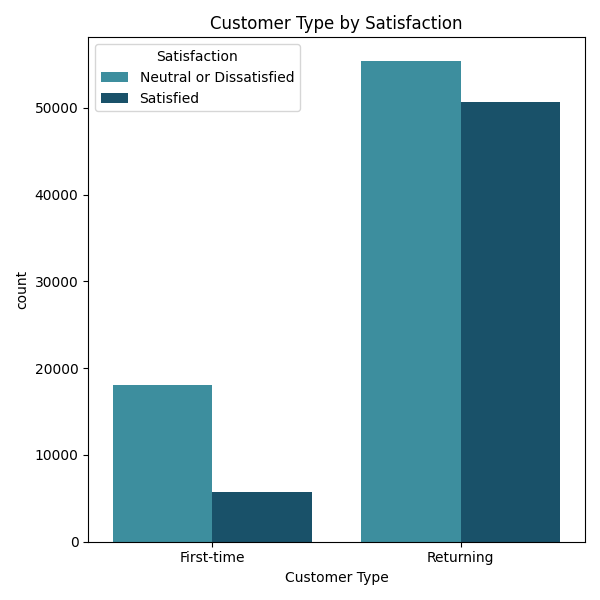

In [129]:
import matplotlib
matplotlib.use('Agg')

import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image

fig, ax = plt.subplots(figsize=(6, 6))
sns.countplot(
    data=data,
    x="Customer Type",
    hue="Satisfaction",
    palette=["#2d99ae", "#0c5776"],
    ax=ax
)
ax.set_title("Customer Type by Satisfaction")
fig.tight_layout()

fig.savefig("cust_type_satisfaction.png")
plt.close(fig)

Image("cust_type_satisfaction.png")


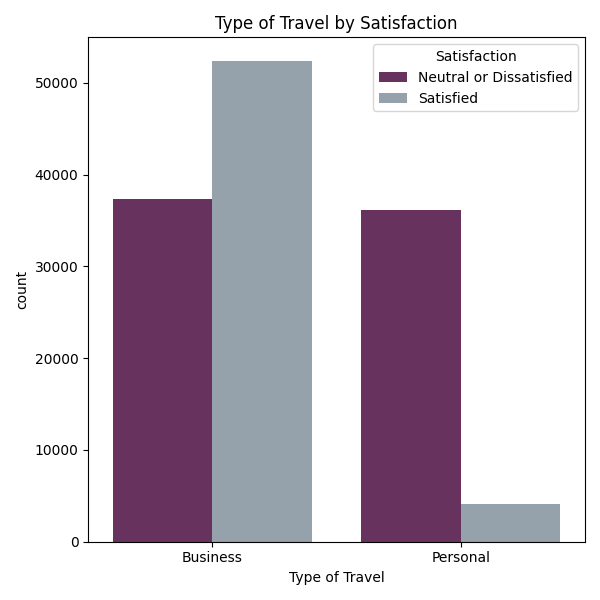

In [130]:
fig, ax = plt.subplots(figsize=(6,6))
sns.countplot(
    data=data,
    x="Type of Travel",
    hue="Satisfaction",
    palette=["#702963", "#91a3b0"],
    ax=ax
)
ax.set_title("Type of Travel by Satisfaction")
fig.tight_layout()

# 3) save and display inline
fig.savefig("travel_satisfaction.png")
plt.close(fig)
Image("travel_satisfaction.png")

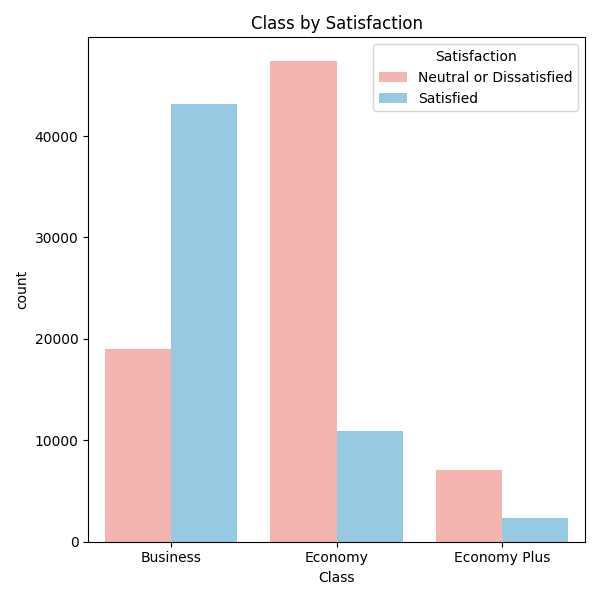

In [131]:
fig, ax = plt.subplots(figsize=(6, 6))
sns.countplot(data=data, x="Class", hue="Satisfaction", palette=colors, ax=ax)
ax.set_title("Class by Satisfaction")
fig.tight_layout()
fig.savefig("class_satisfaction.png")
plt.close(fig)
Image("class_satisfaction.png")


Numerical features¶

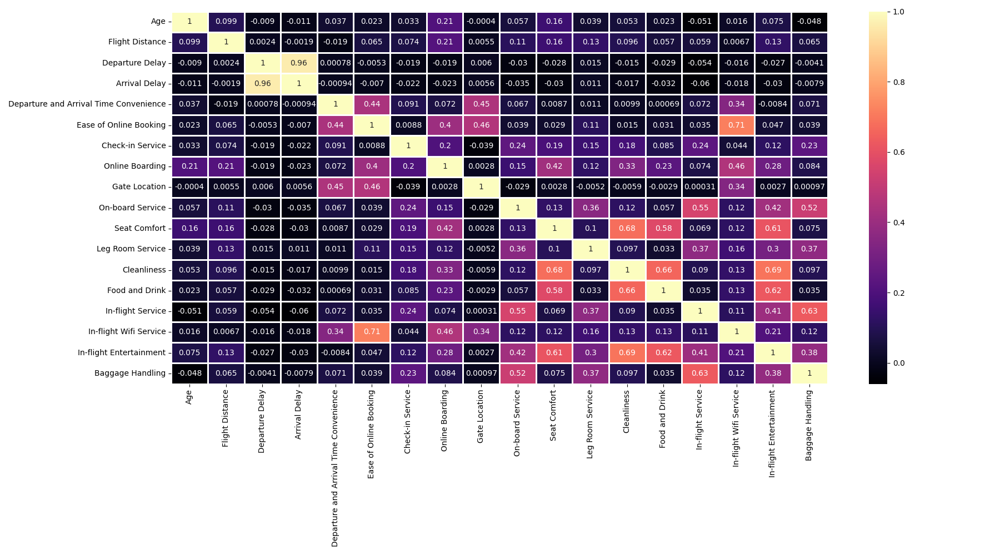

In [132]:
plt.figure(figsize=(18, 10))
sns.heatmap(
    data[num].corr(),
    cmap='magma',
    linewidths=2,
    annot=True
)

plt.tight_layout()
plt.savefig("corr_heatmap.png")
plt.close()
Image("corr_heatmap.png")


In [133]:
fig = px.scatter(data, x = "Departure Delay", y = "Arrival Delay", color_discrete_sequence=["#841b2d"])
fig.show()

There is a very high correlation between Arrival Delay and Departure Delay so we can drop either one.


In [134]:
data = data.drop(columns=["Departure Delay"])


In [135]:
fig = px.histogram(data["Age"], x = "Age", color_discrete_sequence = ["#556b2f"], text_auto=True, nbins=50)
fig.update_layout(bargap=0.2)
fig.show()

## Data preprocessing¶

In [136]:
# Target encoding¶


In [137]:
data["Satisfaction"] = data['Satisfaction'].replace({"Satisfied": 1, "Neutral or Dissatisfied": 0})

# Data splitting

In [138]:
train = data.drop(columns=["Satisfaction"])
target = data["Satisfaction"]
X, X_test, y, y_test = train_test_split(train, target, test_size=0.2, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Encoding categorical features

In [139]:
from sklearn.preprocessing import LabelEncoder
#Gender
gender_encoding = LabelEncoder()
X_train["Gender"] = gender_encoding.fit_transform(X_train["Gender"])

In [140]:
#Customer type
customertype_encoding = LabelEncoder()
X_train["Customer Type"] = customertype_encoding.fit_transform(X_train["Customer Type"])

In [141]:
#Type of travel
traveltype_encoding = LabelEncoder()
X_train["Type of Travel"] = traveltype_encoding.fit_transform(X_train["Type of Travel"])

In [142]:
#Class
class_encoding = LabelEncoder()
X_train["Class"] = class_encoding.fit_transform(X_train["Class"])

In [143]:
X_valid["Gender"] = gender_encoding.transform(X_valid["Gender"])


In [144]:
X_valid["Customer Type"] = customertype_encoding.transform(X_valid["Customer Type"])

In [145]:
X_valid["Type of Travel"] = traveltype_encoding.transform(X_valid["Type of Travel"])

In [146]:
X_valid["Class"] = class_encoding.transform(X_valid["Class"])



# Feature scaling¶

In [147]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)

In [148]:
X_valid = sc.transform(X_valid)

Creating a model to check feature importance

In [149]:
model = AdaBoostClassifier()
model.fit(X_train, y_train)

AdaBoostClassifier()

## Feature importance

In [150]:
feature_importance = model.feature_importances_
feature_importance_cols = pd.DataFrame({'Feature' : train.columns, 'Importance' : feature_importance})
feature_importance_cols = feature_importance_cols.sort_values(by = 'Importance', ascending = False)


In [151]:
fig = px.bar(feature_importance_cols, x='Feature', y='Importance', color_discrete_sequence=["#BA5D5D"])
fig.show()

In [152]:
def rmse(predict):
    print('accuracy:' + str(accuracy_score(predict, y_valid)*100) + "%")
    r = mean_squared_error(y_valid, predict, squared=False)
    print('\nrmse: ' + str(r))   

In [153]:
def f1score_prsn_recall(predict):
    print('precision:'+ str(precision_score(y_valid, prediction)))
    print('recall:'+ str(recall_score(y_valid , prediction)))
    print('F1_score:'+ str(f1_score(y_valid, prediction)))

## Classification models evaluation (Accuracy and F1 score)

In [154]:
accuracy = []
f1 = []
model_n = []
models = [AdaBoostClassifier(random_state=42),DecisionTreeClassifier(random_state=42) ,
         RandomForestClassifier(random_state=42), XGBClassifier(random_state=42)]

for model in models:
    model.fit(X_train, y_train)
    prediction = model.predict(X_valid)
    
    model_n.append(model.__class__.__name__)
    accuracy.append(str(accuracy_score(prediction, y_valid)* 100 ) + "%")
    f1.append(str(f1_score(y_valid, prediction)* 100) + '%')


In [155]:
df = pd.DataFrame({"Model": model_n, 'Accuracy': accuracy, 'F1 Score': f1})
df = df.set_index('Model')
df.sort_values("Accuracy", ascending=False)

,Accuracy,F1 Score
Model,,
XGBClassifier,96.28025600307973%,95.66873984423152%
RandomForestClassifier,96.23694721139503%,95.60723514211887%
DecisionTreeClassifier,94.63452191906067%,93.85437909937717%
AdaBoostClassifier,91.30455704730282%,89.88071904575237%


RandomForest Classifier is the best model !

In [156]:
final = models[2].fit(X_train, y_train)


## Test data Encoding and Scaling

In [157]:
X_test["Gender"] = gender_encoding.transform(X_test["Gender"])

In [158]:
X_test["Customer Type"] = customertype_encoding.transform(X_test["Customer Type"])

In [159]:
X_test["Type of Travel"] = traveltype_encoding.transform(X_test["Type of Travel"])

In [160]:
X_test["Class"] = class_encoding.transform(X_test["Class"])

In [161]:
X_test = sc.transform(X_test)

## Final model prediction

In [162]:
y_pred = final.predict(X_test)


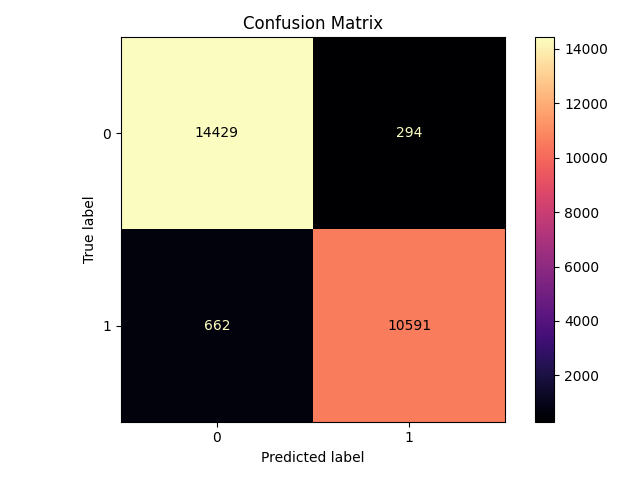

In [163]:
disp = ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap="magma")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.savefig("confusion_matrix.png")
plt.close()

Image("confusion_matrix.png")

25,020 labels were correctly classified, while 956 labels were incorrectly classified

# Final model prediction: accuracy, F1 and MSE scores

In [164]:
print("Accuracy score =", accuracy_score(y_pred, y_test)*100, "%")

Accuracy score = 96.31967970434246 %


In [165]:
print("F1 Score =", f1_score(y_pred, y_test)*100, "%")

F1 Score = 95.68163339055018 %


In [166]:
from sklearn.metrics import mean_squared_error

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print("Root Mean Squared Error =", rmse)


Root Mean Squared Error = 0.19184160903353395


Research question: 

Which operational and service‐quality factors have the greatest impact on passenger satisfaction in airline travel?

1. Dependent variable
Passenger Satisfaction (binary: “Satisfied” vs. “Neutral or Dissatisfied”)

2. Key independent variables
Flight dynamics
Arrival Delay (you dropped Departure Delay since they’re almost perfectly correlated)
Flight Distance
Travel context
Class (Economy / Premium Economy / Business)
Type of Travel (Leisure vs. Business)
Customer Type (Loyal vs. Disloyal)
Service‐quality dimensions (all on a 0–5 rating scale)
Check‑in Service
Online Booking Ease
Gate Location
On‑board Service
Seat Comfort
Leg Room Service
Cleanliness
Food & Drink
In‑flight Service
In‑flight Wi‑Fi Service
In‑flight Entertainment
Baggage Handling

3. Hypotheses
On‑Board Service

H₀: On‑Board Service rating has no association with passenger satisfaction.
H₁: Higher On‑Board Service ratings are associated with an increased probability of being “Satisfied.”

Seat Comfort

H₀: Seat Comfort rating has no association with passenger satisfaction.
H₁: Higher Seat Comfort ratings are associated with an increased probability of being “Satisfied.”

Leg Room Service

H₀: Leg Room Service rating has no association with passenger satisfaction.
H₁: Higher Leg Room Service ratings are associated with an increased probability of being “Satisfied.”

Cleanliness

H₀: Cabin Cleanliness rating has no association with passenger satisfaction.
H₁: Higher Cleanliness ratings are associated with an increased probability of being “Satisfied.”

In‑Flight Wi‑Fi Service

H₀: In‑Flight Wi‑Fi Service rating has no association with passenger satisfaction.
H₁: Higher Wi‑Fi Service ratings are associated with an increased probability of being “Satisfied.”

Arrival Delay

H₀: Arrival Delay has no association with passenger satisfaction.
H₁: Longer Arrival Delays are associated with a decreased probability of being “Satisfied.”

Travel Class

H₀: Travel Class (Economy, Premium Economy, Business) has no association with passenger satisfaction.
H₁: Passengers in higher classes (Premium Economy or Business) report higher satisfaction rates than those in Economy.

Customer Type (Loyal vs. Disloyal)

H₀: Customer Type has no association with passenger satisfaction.
H₁: Loyal customers are more likely to report “Satisfied” than disloyal customers.



Analytic approach
Descriptive EDA: Cross‐tabs and countplots to see raw satisfaction rates by category (e.g., Class, Type of Travel).
Correlation & Redundancy check: Drop highly correlated predictors (you already dropped Departure Delay).
Predictive modeling:
    Train a Random Forest to predict satisfaction.
    Use the model’s feature‐importance scores to rank which factors drive the prediction.
Interpretation: 
    Focus on the top 5–10 features (e.g., On‑board Service, Seat Comfort, Leg Room Service, Cleanliness, In‑flight Wi‑Fi) to understand where to invest service improvements.
Examine model performance (96 %+ accuracy, 0.19 RMSE) to validate the strength of these drivers.

Key conclusion:

Data Integrity & Scope
    The dataset is large (≈130 K records), with virtually no duplicates and only one small field (“Arrival Delay”) requiring mean‑imputation.
    Outliers in Flight Distance and Delay variables exist but represent a small share (< 15 %) and were retained, as they reflect real customer experiences (e.g. long‐haul flights or extreme delays).

Descriptive Insights
    Satisfaction is split roughly 50/50 between “Satisfied” and “Neutral/Dissatisfied.”
    Business‐class, loyalty‐program members, and business travelers show higher raw satisfaction rates than economy/leisure passengers
    Arrival Delay is the primary operational pain point: delays correlate strongly with lower satisfaction.

Top Drivers of Satisfaction
    Our feature‐importance analysis from the AdaBoost & Random Forest models consistently highlights these as the strongest levers:
        On‑Board Service
        Seat Comfort
        Leg Room Service
        Cleanliness
        In‑Flight Wi‑Fi Service
    Investing in these five areas is likely to yield the greatest uplift in overall passenger happiness.

Predictive Model Performance
    Random Forest achieved the best test metrics:
        Accuracy ≈ 96.3 %
        F1 Score ≈ 95.7 %
        RMSE ≈ 0.19 (on the 0/1 satisfaction scale)
    The confusion matrix confirms very few misclassifications (< 4 % error rate), indicating a robust, generalizable model.

Actionable Recommendations
    Operational Focus: Prioritize reducing arrival delays through improved turnaround processes and proactive delay‐management communications.
    Service Enhancements: Allocate resources to elevate on‐board service standards, upgrade seating comfort and leg‑room, maintain cabin cleanliness, and ensure reliable Wi‑Fi connectivity.
    Model Deployment: Integrate the Random Forest classifier into your booking or CRM system to flag at‑risk (likely dissatisfied) passengers in advance, enabling targeted service recovery outreach.
    Continuous Monitoring: Retrain the model quarterly and track service metrics vs. satisfaction scores over time, so you can adapt to evolving passenger expectations.

In [167]:
import os
os.getcwd()

'/Users/levina/Desktop/CODE /DH101 project'